# Лабораторная работа №1. Звуки и сигналы

### Лодочникова Владлена. Группа №5130901/10202

### Упражнение 1.1 

Был загружен файл chap01.ipynb, просмотрены пояснения и примеры. 

### Упражнение 1.2

In [2]:
import os
import wget

if not os.path.exists('../thinkdsp.py'):
    wget.download('https://github.com/AllenDowney/ThinkDSP/raw/master/code/thinkdsp.py')

Загрузим с сайта freesound.org образец звука и исследуем его различными способами. При исследовании будем использовать библиотеку thinkdsp. Для начала представим исследуемый образец в виде волны (wave).

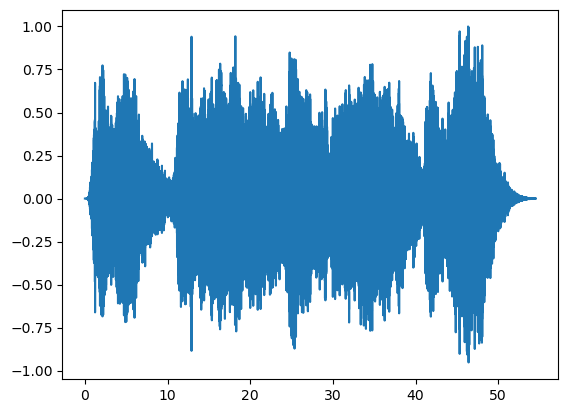

In [51]:
import sys
sys.path.append('../')
from thinkdsp import read_wave
from IPython.display import Audio
wave = read_wave('sirenae.wav')
audio = Audio(data=wave.ys, rate=wave.framerate)
wave.plot()
audio

Выделим промежуток длительностью 0.5 секунды - с 27.5 по 32.5 и будем его исследовать.

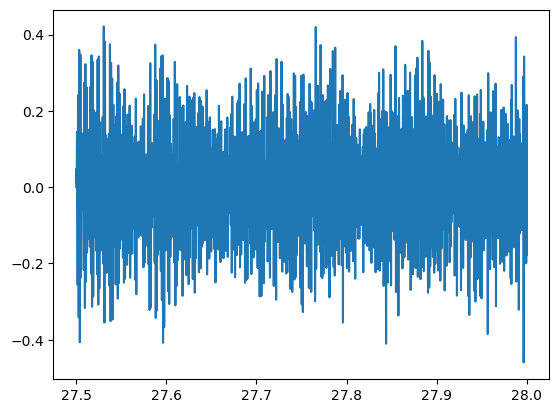

In [29]:
segment = wave.segment(start = 27.5, duration= 0.5)
audio1 = Audio(data=segment.ys, rate=segment.framerate)
segment.plot()
audio1

Получим спектр выбранного фрагмента.

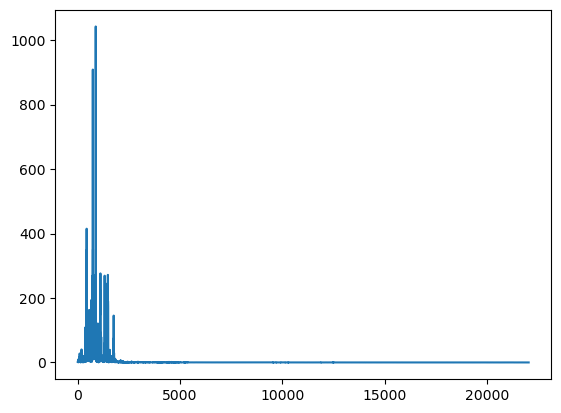

In [30]:
spectrum = segment.make_spectrum()
spectrum.plot()

Из графика выше видно, что в выбранном сегменте преобладают низкие частоты. 
    

Ограничим рассматриваемую частоту до 2000 Гц, чтобы посмотреть, какие частоты являются доминирующими в данном фрагменте. 

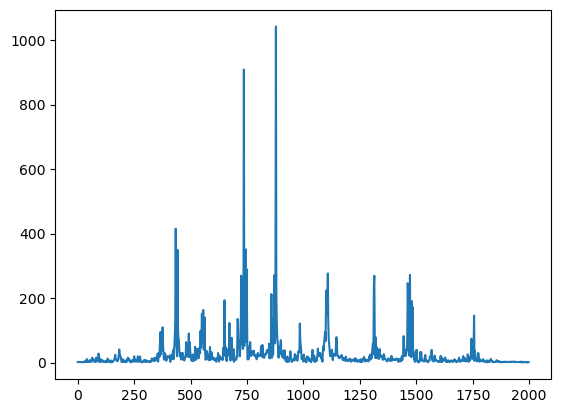

In [31]:
spectrum.plot(high=2000)

По графику сигнала никак нельзя судить о форме сигнала, так как взят слишком большой период времени. Получим список пиковых частот. 


In [32]:
spectrum.peaks()[:5]

[(1042.0512379416643, 878.0),
 (908.3768351419701, 736.0),
 (414.86486274470013, 434.0),
 (350.73806482324295, 744.0),
 (349.40914603643483, 442.0)]

Основная частота равна 878 Гц, что примерно соответствует ноте Ля второй октавы. 

Отбросим высокие частоты (более 2000 Гц) и послушаем, что получилось.

In [28]:
spectrum.low_pass(2000)
spectrum.make_wave().make_audio()

Звук стал ниже. 
Теперь отбросим низкие частоты (ниже 1500 Гц) и послушаем, что получилось.

In [34]:
spectrum.high_pass(1500)
spectrum.make_wave().make_audio()

Звук стал выше. Теперь, используя band_stop, отбросим все частоты вне диапазона 500Гц - 2000Гц

In [35]:
spectrum.band_stop(500,2000)
spectrum.make_wave().make_audio()

Звук стал ещё выше.

### Упражнение 1.3

Создадим обьекты SinSignal и CosSignal, просумируем их. Получим сложный сигнал.

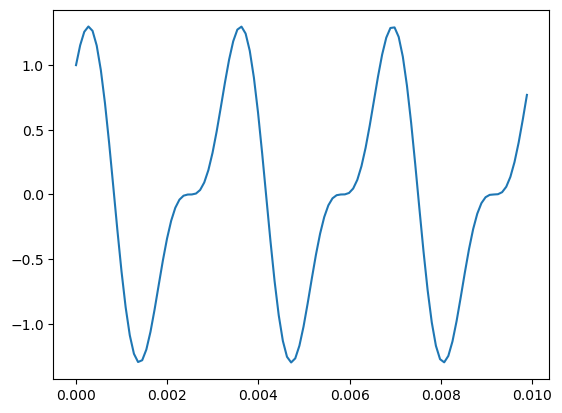

In [42]:
from thinkdsp import CosSignal, SinSignal

cos_sig = CosSignal(freq=300, amp=1.0, offset=0)
sin_sig = SinSignal(freq=600, amp=0.5, offset=0)
mix = sin_sig + cos_sig
mix.plot()
wave2 = mix.make_wave()
audio2 = Audio(data=wave2.ys, rate=wave2.framerate)
audio2

Вычислим спектр данного сигнала и распечатаем его.


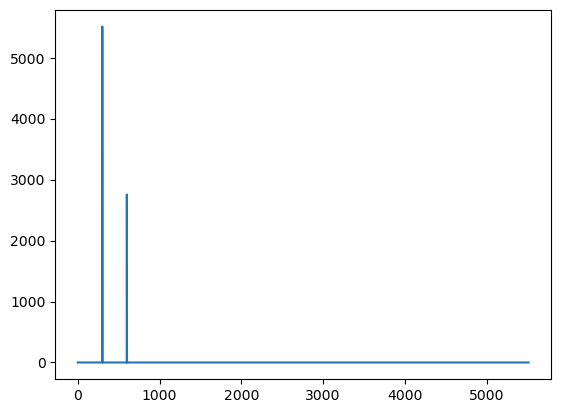

In [43]:
spectrum2 = mix.make_wave().make_spectrum()
spectrum2.plot()

Если добавить сигнал, не кратный 100, можно услышать его как выделяющийся звук.

In [45]:
mix += SinSignal(freq=850)
mix.make_wave().make_audio()

### Упражнение 1.4

Напишем функцию stretch, берущую wave и коэффициент изменения.  
Функция должна ускорять или замедлять сигнал.

In [46]:
def stretch(wave, factor):
    wave.ts *= factor
    wave.framerate /= factor

Протестируем созданную функцию.

In [52]:
stretch(wave, 2)
wave.make_audio()

Длительность аудиозаписи увеличится в два раза. 
Увеличение массива моментов выборки (ts) и изменение сигнала приведут к удлинению длительности аудиозаписи в два раза. Одновременно уменьшение частоты фреймов замедлит процесс записи.